In [44]:
import os

folders = ['pegon-annotated-dataset/Mujarobat Doa', 'pegon-annotated-dataset/Mujarobat Kubro', 'pegon-annotated-dataset/Majmuah Syariah']

counter = 1
for folder in folders:
    files = os.listdir(folder)
    for file in files:
        file_path = os.path.join(folder, file)
        new_file_name = str(counter) + '.json'
        new_file_path = os.path.join(folder, new_file_name)
        os.rename(file_path, new_file_path)
        counter += 1

In [6]:
!python Labelme2YOLO/labelme2yolo.py --json_dir 'pegon-annotated-dataset/Mujarobat Doa' --val_size 0.2
!python Labelme2YOLO/labelme2yolo.py --json_dir 'pegon-annotated-dataset/Mujarobat Kubro' --val_size 0.2
!python Labelme2YOLO/labelme2yolo.py --json_dir 'pegon-annotated-dataset/Majmuah Syariah' --val_size 0.2

Converting Image (26).json for train ...
Converting Image (13).json for train ...
Converting Image (11).json for train ...
Converting Image (42).json for train ...
Converting Image (5).json for train ...
Converting Image (48).json for train ...
Converting Image (17).json for train ...
Converting Image (73).json for train ...
Converting Image (19).json for train ...
Converting Image (7).json for train ...
Converting Image (10).json for train ...
Converting Image (30).json for train ...
Converting Image (12).json for train ...
Converting Image (2).json for train ...
Converting Image (25).json for train ...
Converting Image (8).json for train ...
Converting Image (3).json for train ...
Converting Image (41).json for train ...
Converting Image (14).json for train ...
Converting Image (20).json for train ...
Converting Image (4).json for train ...
Converting Cover-1.json for train ...
Converting Image (43).json for train ...
Converting Image (23).json for train ...
Converting Image (32).jso

In [8]:
import shutil
import os

# Destination folder
destination = 'YOLODataset'
folders = ['pegon-annotated-dataset/Mujarobat Doa', 'pegon-annotated-dataset/Mujarobat Kubro', 'pegon-annotated-dataset/Majmuah Syariah']
folders = [folder + f'/{destination}' for folder in folders]

# Copy files and folders from source to destination
for folder in folders:
    for root, dirs, files in os.walk(folder):
        # Create corresponding directories in the destination folder
        for dir_name in dirs:
            source_dir = os.path.join(root, dir_name)
            destination_dir = os.path.join(destination, os.path.relpath(source_dir, folder))
            os.makedirs(destination_dir, exist_ok=True)

        # Copy files to the destination folder
        for file_name in files:
            source_file = os.path.join(root, file_name)
            destination_file = os.path.join(destination, os.path.relpath(source_file, folder))
            shutil.copy2(source_file, destination_file)

In [92]:
import yaml

# Load the YAML file
with open('YOLODataset/dataset.yaml', 'r') as file:
    data = yaml.safe_load(file)

# Make changes to the data
data['train'] = 'YOLODataset/images/train/'
data['val'] = 'YOLODataset/images/val/'
data['nc'] = 2198
data['names'] = '[' + ', '.join(['1' for i in range(2198)]) + ']'

# Save the modified YAML back to the file
with open('YOLODataset/dataset.yaml', 'w') as file:
    yaml.dump(data, file)

In [10]:
folder_path = 'yolov5/YOLODataset/labels/val'  # Replace with the actual folder path

for filename in os.listdir(folder_path):
    if filename.endswith('.txt'):
        file_path = os.path.join(folder_path, filename)
        with open(file_path, 'r') as file:
            lines = file.readlines()

        with open(file_path, 'w') as file:
            for line in lines:
                words = line.split()
                if words:
                    words[0] = '1'
                    modified_line = ' '.join(words)
                    file.write(modified_line + '\n')

In [11]:
import json

folder_path = '../../Dataset/Synthesized/'
dest_path = 'synth-yolo'
file_height = 2338
file_width = 1653
count = 1

for subfolder in os.listdir(folder_path):
    subfolder = os.path.join(folder_path, subfolder)
    for filename in os.listdir(subfolder):
        if filename.endswith('.json') and not filename.startswith('config'):
            
            file_path = os.path.join(subfolder, filename)
            img_path =  file_path[:-4] + 'png'
            shutil.copy(img_path, f'{dest_path}/images/{count}s.png')
            bboxes = []
            
            with open(file_path, 'r') as json_file:
                data = json.load(json_file)
            for elem in data:
                bbox = elem['bbox']
                
                x_center = (bbox[0] + bbox[2])/(2*file_width)
                y_center = (bbox[1] + bbox[3])/(2*file_height)
                height = (bbox[3] - bbox[1])/file_height
                width = (bbox[2] - bbox[0])/file_width

                bboxes.append(f'1 {x_center} {y_center} {width} {height}')
                
            with open(f"{dest_path}/labels/{count}s.txt", "w") as file:
                for bbox in bboxes:
                    file.write(bbox + "\n")
                    
            count+=1

In [12]:
import random

source_folder = 'synth-yolo'
dest_folder = 'yolov5/YOLODataset'

# Calculate the number of files to select
numbers_to_mix = int(2900 * 0.15)
numbers_to_train = int(numbers_to_mix * 0.8)
# Randomly select 80% of files
numbers = random.sample([i+1 for i in range(2900)], numbers_to_mix)
train_numbers = random.sample(numbers, numbers_to_train)

# Copy selected files to folder A
for number in train_numbers:
    
    img_file = os.path.join(source_folder, 'images', f'{number}s.png')
    txt_file = os.path.join(source_folder, 'labels', f'{number}s.txt')

    dest_img = os.path.join(dest_folder, 'images', 'train', f'{number}s.png')
    dest_txt = os.path.join(dest_folder, 'labels', 'train', f'{number}s.txt')
    
    shutil.copy(img_file, dest_img)
    shutil.copy(txt_file, dest_txt)

# Copy the remaining files to folder B
for number in numbers:
    if number not in train_numbers:
        img_file = os.path.join(source_folder, 'images', f'{number}s.png')
        txt_file = os.path.join(source_folder, 'labels', f'{number}s.txt')

        dest_img = os.path.join(dest_folder, 'images', 'val', f'{number}s.png')
        dest_txt = os.path.join(dest_folder, 'labels', 'val', f'{number}s.txt')

        shutil.copy(img_file, dest_img)
        shutil.copy(txt_file, dest_txt)

In [49]:
# Melihat GPU yang tersedia dan penggunaannya.
!nvidia-smi --query-gpu=index,memory.used,memory.total,memory.free,utilization.gpu --format=csv,noheader | awk -F "," 'BEGIN{printf "%-3s \t%7s\t%5s\t%12s\n", "GPU", "Memory", "Free", "RAM"}{printf "%s:\t%6.2f%%\t%7s\t%s\n", $1, ($2/$3)*100, $4, $5}'

GPU 	 Memory	 Free	         RAM
0:	 48.50%	 20878 MiB	 0 %
1:	 98.19%	 732 MiB	 0 %
2:	 43.76%	 22796 MiB	 100 %
3:	 97.58%	 980 MiB	 62 %
4:	 98.20%	 731 MiB	 0 %
5:	 78.49%	 8719 MiB	 100 %
6:	 98.19%	 732 MiB	 0 %
7:	 98.19%	 733 MiB	 0 %


In [1]:
# Memilih GPU yang akan digunakan (contohnya: GPU #7)
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '5'

In [60]:
# Train YOLOv5s on COCO128 for 3 epochs
!python yolov5/train.py --single-cls --img 640 --batch 2 --epochs 300 --data yolov5/YOLODataset/dataset.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=yolov5/YOLODataset/dataset.yaml, hyp=yolov5/data/hyps/hyp.scratch-low.yaml, epochs=300, batch_size=2, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=True, optimizer=SGD, sync_bn=False, workers=8, project=yolov5/runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: ⚠️ YOLOv5 is out of date by 6 commits. Use 'git pull' or 'git clone https://github.com/ultralytics/yolov5' to update.
requirements: Ultralytics requirement "thop>=0.1.1" not found, attempting AutoUpdate...
requirements: ❌ AutoUpdate skipped (offline)
YOLOv5 🚀 v7.0-171-g6e04b94 Python-3.8.12 torch-2.0.1+cu117 CUDA:0 (A100-SXM4-40GB, 40537MiB)

hyperparameters: lr0=0.01, l

      5/299     0.644G    0.08171     0.2359          0         45        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        107       3038      0.427      0.689      0.469       0.16

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
      6/299     0.644G    0.07733     0.2267          0         32        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        107       3038      0.519      0.726      0.561      0.203

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
      7/299     0.644G    0.07868     0.2185          0         53        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        107       3038      0.567      0.743      0.682      0.309

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
      8/29

     30/299     0.646G    0.05925     0.1837          0         23        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        107       3038      0.949      0.915      0.969      0.589

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     31/299     0.646G    0.05871     0.1759          0         32        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        107       3038      0.933      0.917      0.967      0.597

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     32/299     0.646G    0.06005     0.1871          0         94        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        107       3038      0.919      0.908      0.964      0.624

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     33/29

     55/299     0.646G    0.05556     0.1701          0         93        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        107       3038      0.979      0.949       0.98       0.69

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     56/299     0.646G    0.05464     0.1682          0         62        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        107       3038      0.972       0.94      0.977      0.671

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     57/299     0.646G    0.05574     0.1697          0         26        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        107       3038       0.98      0.948      0.981      0.665

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     58/29

     80/299     0.646G    0.05244     0.1601          0          2        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        107       3038      0.987      0.951      0.982      0.716

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     81/299     0.646G    0.05194     0.1554          0         24        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        107       3038      0.987      0.947      0.981      0.703

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     82/299     0.646G     0.0545     0.1625          0         71        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        107       3038      0.988      0.948      0.982       0.71

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     83/29

    105/299     0.646G    0.05061     0.1511          0         58        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        107       3038      0.985      0.957      0.984      0.738

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    106/299     0.646G    0.05151     0.1528          0         67        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        107       3038      0.985      0.948      0.982      0.711

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    107/299     0.646G    0.05246     0.1557          0         19        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        107       3038      0.988      0.952      0.983      0.715

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    108/29

    130/299     0.646G    0.04952     0.1461          0        109        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        107       3038      0.995      0.964      0.985      0.726

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    131/299     0.646G    0.05065     0.1492          0         43        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        107       3038      0.993      0.965      0.985      0.744

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    132/299     0.646G    0.04939     0.1508          0         65        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        107       3038      0.993      0.962      0.985      0.729

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    133/29

    155/299     0.646G    0.04833     0.1443          0         23        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        107       3038      0.996      0.967      0.986      0.758

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    156/299     0.646G    0.04882     0.1418          0         11        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        107       3038      0.996      0.967      0.986      0.762

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    157/299     0.646G    0.04859     0.1489          0         29        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        107       3038      0.995      0.966      0.986      0.757

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    158/29

    180/299     0.646G    0.04823      0.145          0        110        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        107       3038      0.994      0.966      0.985      0.765

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    181/299     0.646G    0.04772     0.1427          0         54        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        107       3038      0.993      0.965      0.985      0.769

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    182/299     0.646G    0.04807     0.1406          0        101        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        107       3038      0.994      0.964      0.985      0.764

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    183/29

    205/299     0.646G    0.04855     0.1409          0         36        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        107       3038      0.994      0.969      0.987      0.775

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    206/299     0.646G    0.04716     0.1376          0          9        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        107       3038      0.994      0.968      0.986      0.773

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    207/299     0.646G    0.04611      0.137          0         43        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        107       3038      0.993      0.969      0.985       0.77

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    208/29

    230/299     0.646G    0.04727     0.1353          0         62        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        107       3038      0.993      0.973      0.988       0.78

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    231/299     0.646G    0.04681      0.136          0         39        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        107       3038      0.994       0.97      0.987      0.779

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    232/299     0.646G     0.0465     0.1349          0         49        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        107       3038      0.996      0.968      0.986      0.779

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    233/29

    255/299     0.646G    0.04647     0.1313          0         57        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        107       3038      0.994       0.97      0.988      0.785

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    256/299     0.646G    0.04641     0.1333          0         26        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        107       3038      0.994       0.97      0.987      0.788

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    257/299     0.646G    0.04631     0.1349          0         84        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        107       3038      0.994       0.97      0.988      0.787

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    258/29

    280/299     0.646G     0.0465     0.1308          0         37        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        107       3038      0.997       0.97      0.987      0.786

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    281/299     0.646G    0.04618     0.1326          0         26        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        107       3038      0.995       0.97      0.987      0.792

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    282/299     0.646G    0.04611     0.1311          0         66        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        107       3038      0.995       0.97      0.987      0.792

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    283/29

In [87]:
import torch
from PIL import Image
# import sys
# sys.path.insert(0, './yolov5/')

model = torch.hub.load('ultralytics/yolov5', 'custom', 'yolov5/runs/train/exp4/weights/best.pt')
im1 = Image.open('../Dataset/Majmuah Syariah/Image (62).bmp')  # PIL image
im1 = im1.rotate(90, expand=True)

# Inference
results = model(im1) # batch of images

results.pandas().xyxy[0]

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2023-6-8 Python-3.8.12 torch-2.0.1+cu117 CUDA:0 (A100-SXM4-40GB, 40537MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients
Adding AutoShape... 


,xmin,ymin,xmax,ymax,confidence,class,name
0,300.904297,1706.555176,1515.709961,1812.994019,0.927106,0,item
1,306.366669,1809.578247,1508.580078,1911.354492,0.923240,0,item
2,1724.548706,1526.710571,2957.185547,1630.829712,0.915029,0,item
3,1721.831543,1436.829346,2956.793213,1534.437622,0.913965,0,item
4,306.770081,841.207703,1508.013306,943.507080,0.904235,0,item
5,1741.683960,651.350037,2945.044434,755.714966,0.899541,0,item
6,1725.555420,1621.756836,2954.451416,1732.273315,0.898829,0,item
7,302.292480,734.403625,1507.320435,840.335815,0.888535,0,item
8,1723.349731,1337.638062,2953.688232,1433.329834,0.885346,0,item
9,1744.209961,560.400391,2942.980957,656.330505,0.884830,0,item


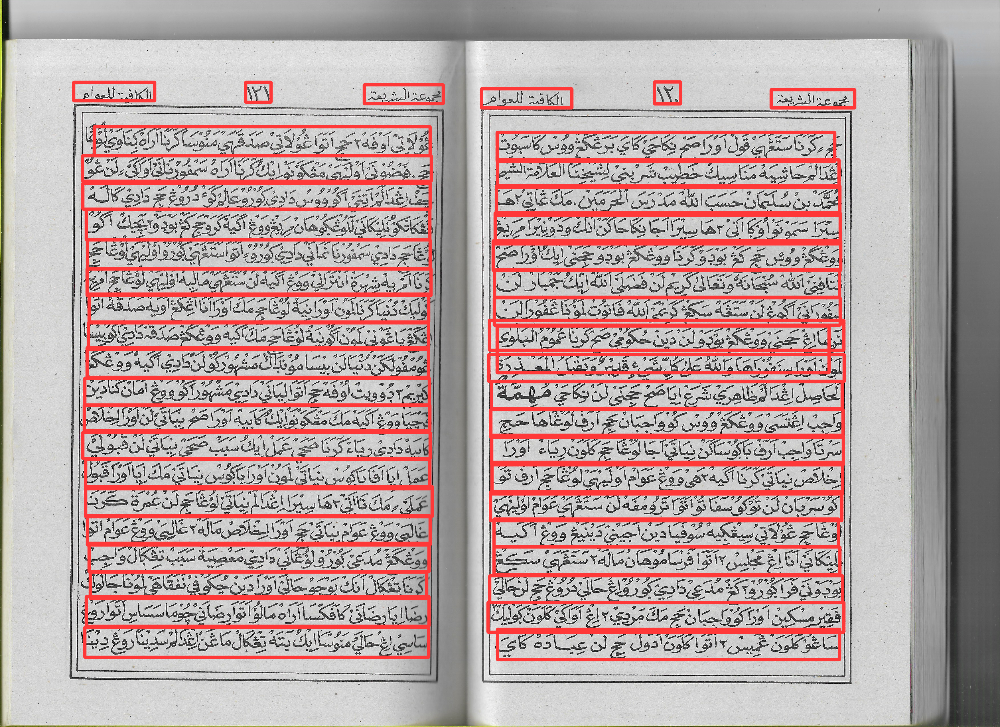

error: OpenCV(4.5.5) /io/opencv/modules/highgui/src/window.cpp:1000: error: (-215:Assertion failed) size.width>0 && size.height>0 in function 'imshow'


In [88]:
import cv2

res_plotted = results.show(labels=False)
cv2.imshow("result", res_plotted)

In [89]:
results.pandas().xyxy[0].to_csv('yolo.csv', index=False)